In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ast
from wordcloud import WordCloud

from collections import Counter

from sklearn.cluster import DBSCAN, OPTICS, KMeans
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.mixture import GaussianMixture
from sklearn.metrics import davies_bouldin_score, silhouette_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [78]:
df = pd.read_csv("df.csv")
df_tsne = pd.read_csv("df_tsne.csv")

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [3]:
df_tsne['genres'] = df_tsne['genres'].apply(lambda x: 'unknown' if len(x) == 2 else x)

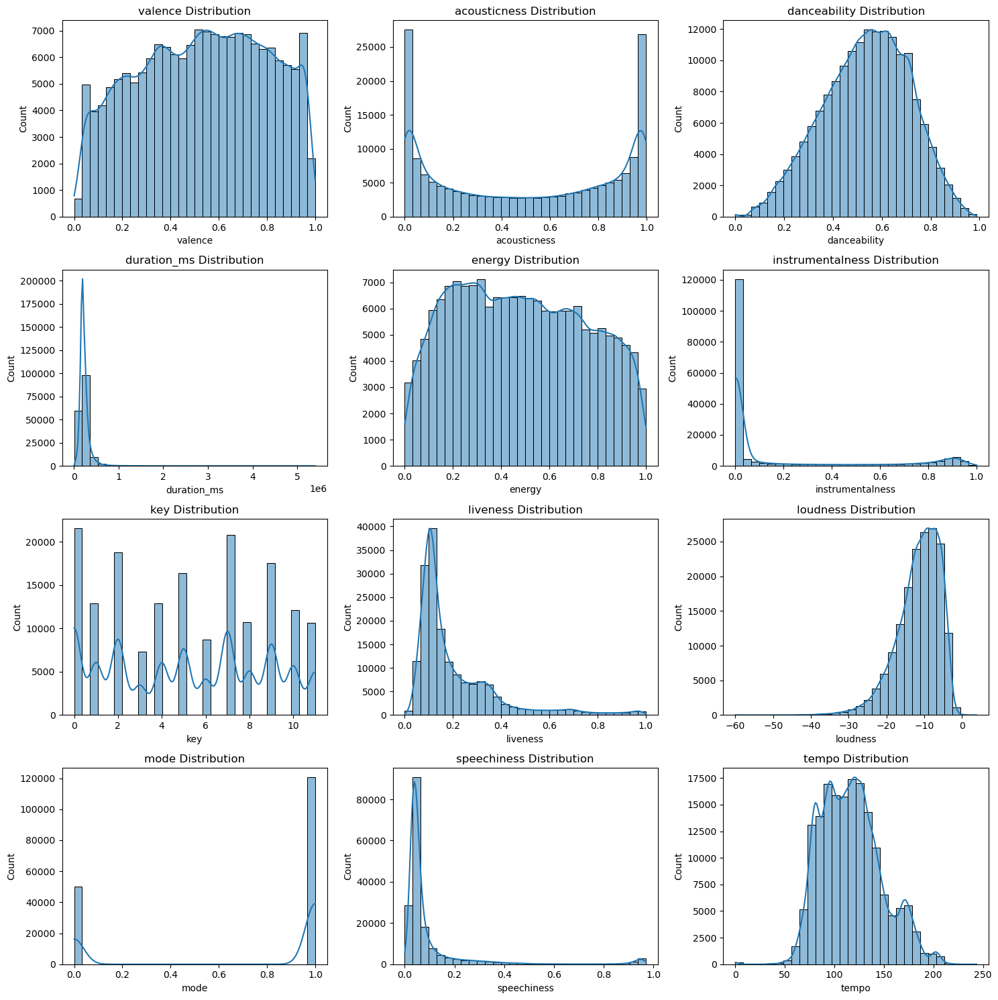

In [3]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

select_variables = ['valence', 'acousticness', 'danceability', 
                    'duration_ms', 'energy', 'instrumentalness', 'key',
                    'liveness', 'loudness', 'mode', 'speechiness', 'tempo']

# 設定圖形的排列
n_rows = 4
n_cols = 3
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))
axes = axes.flatten()

# 遍歷每個變數，繪製長條圖和累積分佈曲線
for i, var in enumerate(select_variables):
    ax = axes[i]
    
    # 繪製長條圖
    sns.histplot(df[var], bins=30, kde=True, ax=ax)
    ax.set_title(f'{var} Distribution')
    
plt.tight_layout()
plt.show()

https://medium.com/ai反斗城/preprocessing-data-數據特徵標準化和歸一化-9bd3e5a8f2fc

**五、需要標準化數據的算法
PCA、SVM、 SGD、linear/logistic regression 、Kmeans、KNN、NN（如果有用L1/L2 regularization）涉及到距離有關的算法，或者聚類的話，都是需要先做變量標準化的。
DecisionTree 、0/1取值的特徵、 基於平方損失的最小二乘法OLS，不需要歸一化。**

1. 只做標準化

In [57]:
select_variables = ['duration_ms', 'key', 'loudness', 'tempo',
                    'valence', 'acousticness', 'danceability', 
                    'energy', 'instrumentalness',
                    'liveness', 'mode', 'speechiness']

standard_data = scale.fit_transform(df[select_variables])

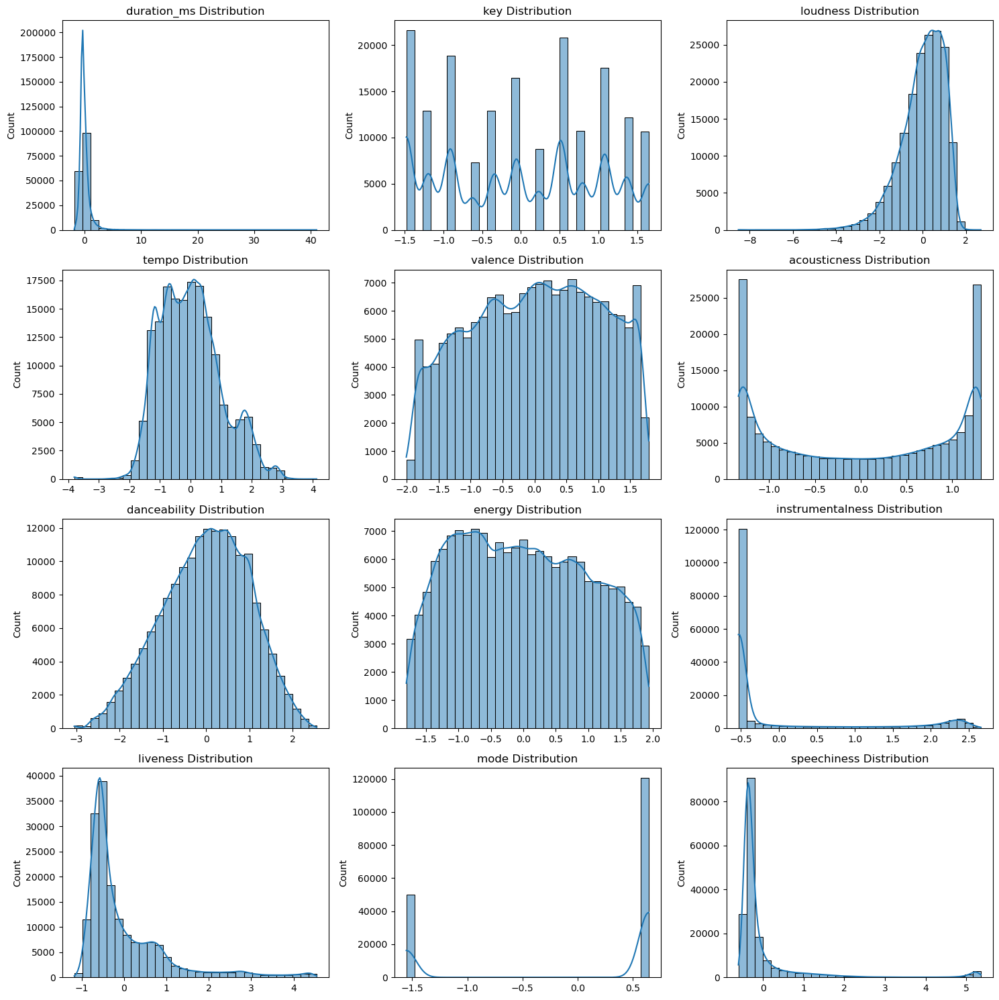

In [58]:
n_rows = 4
n_cols = 3
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))
axes = axes.flatten()

# 遍歷每個變數，繪製長條圖
for i, var in enumerate(select_variables):
    ax = axes[i]
    
    # 繪製長條圖
    sns.histplot(standard_data[:, i], bins=30, kde=True, ax=ax)
    ax.set_title(f'{var} Distribution')
    
plt.tight_layout()
plt.show()

In [3]:
select_variables = ['valence', 'acousticness', 'danceability', 
                    'energy', 'instrumentalness',
                    'liveness', 'mode', 'speechiness']

select = ['duration_ms', 'key', 'loudness', 'tempo']

# MinMaxScaler
norm = MinMaxScaler()
# 將資料進行 normalization
normalized_data = norm.fit_transform(df[select])

# StandardScaler
scale = StandardScaler()
# 將所有變數進行標準化，包括歸一化後的 select 變數和 select_variables 中的其他變數
scaled_data = scale.fit_transform(pd.concat([pd.DataFrame(normalized_data, columns=select), df[select_variables]], axis=1))

2. 

step 1 先做'duration_ms', 'key', 'loudness', 'tempo' 先做歸一化

step 2 在一同與其他變數作標準化處理 

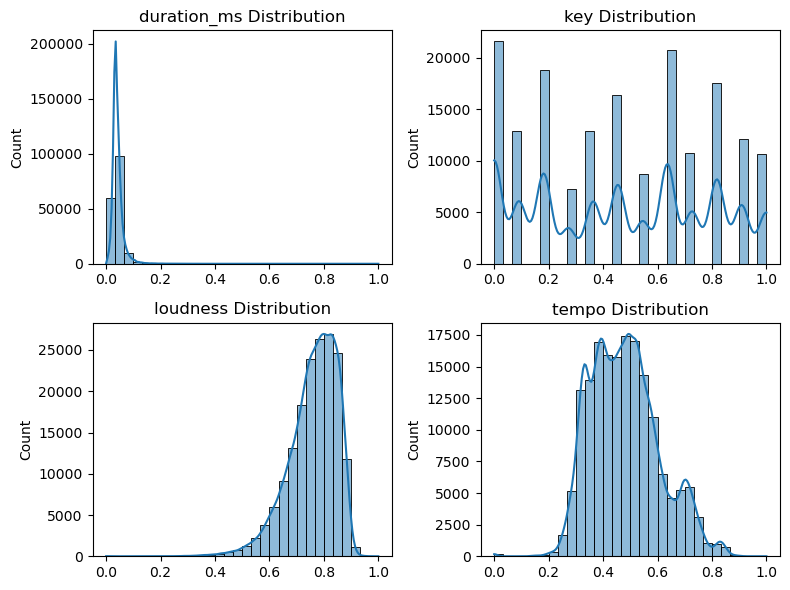

In [45]:
n_rows = 2
n_cols = 2
fig, axes = plt.subplots(n_rows, n_cols, figsize=(8, 6))
axes = axes.flatten()

# 遍歷每個變數，繪製長條圖
for i, var in enumerate(select):
    ax = axes[i]
    
    # 繪製長條圖
    sns.histplot(normalized_data[:, i], bins=30, kde=True, ax=ax)
    ax.set_title(f'{var} Distribution')
    
plt.tight_layout()
plt.show()

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

IndexError: index 4 is out of bounds for axis 0 with size 4

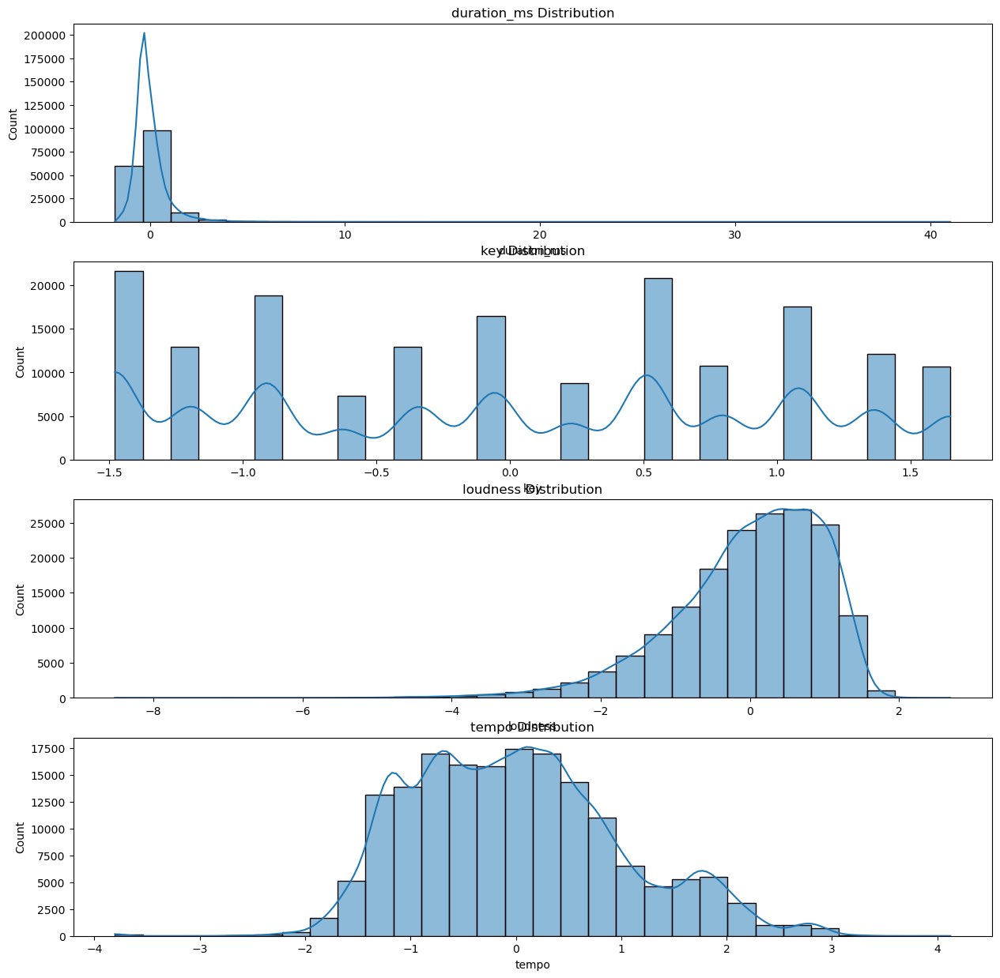

In [8]:
# 將 scaled_data 轉換為 DataFrame
scaled_df = pd.DataFrame(scaled_data, columns=select + select_variables)

# 設定圖形的排列
n_rows = 4
n_cols = 1
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))
axes = axes.flatten()

# 遍歷每個變數，繪製長條圖
for i, var in enumerate(select + select_variables):
    ax = axes[i]
    
    # 繪製長條圖
    sns.histplot(scaled_df[var], bins=30, kde=True, ax=ax)
    ax.set_title(f'{var} Distribution')
    
plt.tight_layout()
plt.show()

## DBSCAN

### 1. KNN決定eps參數

In [5]:
# 初始化 NearestNeighbors模型
nbrs = NearestNeighbors(n_neighbors=5).fit(scaled_data)

# 計算每個樣本的最近鄰居距離
distances, indices = nbrs.kneighbors(scaled_data)

# 將距離排序
distances = np.sort(distances, axis=0)

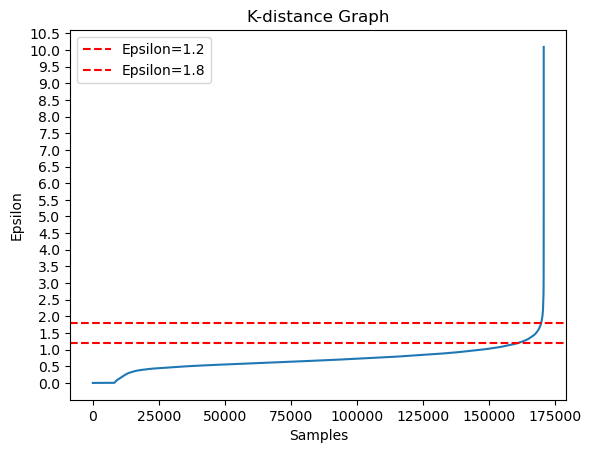

In [6]:
max_y = np.ceil(np.max(distances))  
y_ticks = np.arange(0, max_y + 0.5, 0.5)
plt.yticks(y_ticks)

# 計算K距離圖
plt.plot(distances[:, 1])
plt.axhline(y=1.2, color='r', linestyle='--', label='Epsilon=1.2')
plt.axhline(y=1.8, color='r', linestyle='--', label='Epsilon=1.8')
plt.xlabel('Samples')
plt.ylabel('Epsilon')
plt.title('K-distance Graph')
plt.legend()
plt.show()

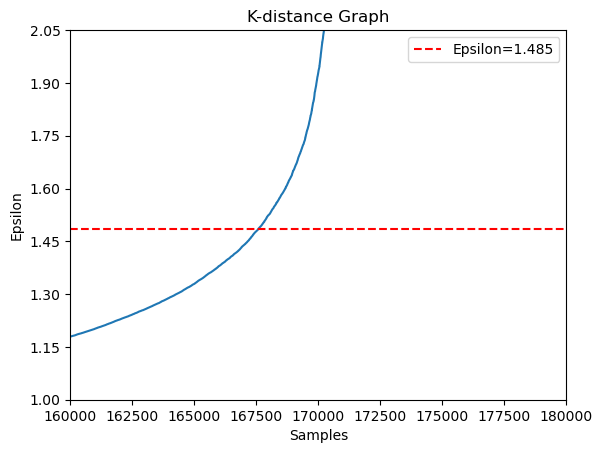

In [24]:
# 設定局部放大的範圍
x_zoom = 170000
y_zoom = 1.5
x_range = 10000  # 放大範圍的 x 軸距離
y_range = 0.5   # 放大範圍的 y 軸距離

# 設定 x 和 y 軸的顯示範圍
plt.xlim(x_zoom - x_range, x_zoom + x_range)
plt.ylim(y_zoom - y_range, y_zoom + y_range)

plt.yticks(np.arange(y_zoom - y_range, y_zoom + y_range + 0.1, 0.15))

# 計算K距離圖
plt.plot(distances[:, 1])
plt.axhline(y=1.485, color='r', linestyle='--', label='Epsilon=1.485')
plt.xlabel('Samples')
plt.ylabel('Epsilon')
plt.title('K-distance Graph')
plt.legend()
plt.show()

In [25]:
dbscan = DBSCAN(eps=1.485, min_samples=5)
clusters = dbscan.fit_predict(scaled_data)

In [26]:
data_with_clusters = df_tsne.copy()
data_with_clusters['Cluster'] = clusters

clustered_groups = data_with_clusters.groupby('Cluster')

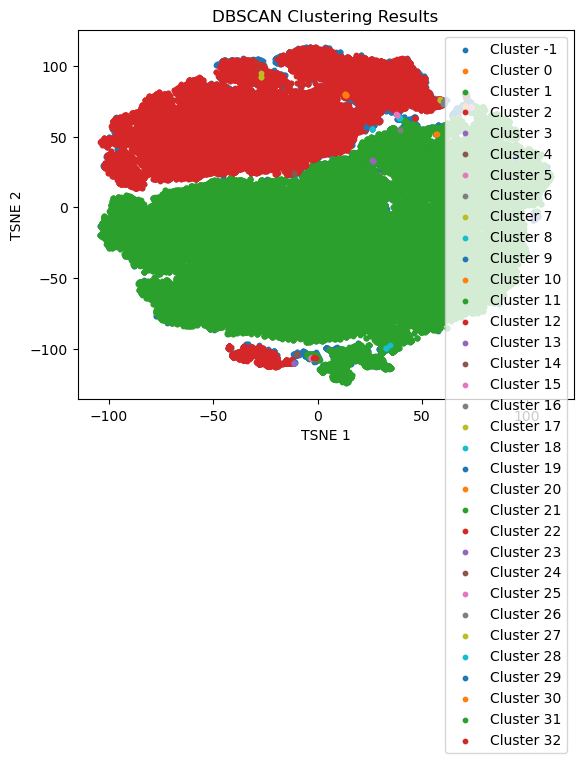

In [46]:
# 視覺化分群結果
for name, group in clustered_groups:
    plt.scatter(group['tsne_1'], group['tsne_2'], label=f'Cluster {name}', marker='o', s=10)

plt.xlabel('TSNE 1')
plt.ylabel('TSNE 2')
plt.title('DBSCAN Clustering Results')
plt.legend()
plt.show()

In [50]:
data_with_clusters['Cluster'].value_counts().sort_index()

Cluster
-1       4549
 0          8
 1     118020
 2      47908
 3         20
 4         10
 5          7
 6          2
 7          8
 8          8
 9          5
 10         7
 11         5
 12         5
 13         4
 14         4
 15         6
 16         5
 17         3
 18         5
 19         6
 20         5
 21         4
 22         3
 23         5
 24         6
 25         5
 26         8
 27         3
 28         5
 29         3
 30         3
 31         3
 32         5
Name: count, dtype: int64

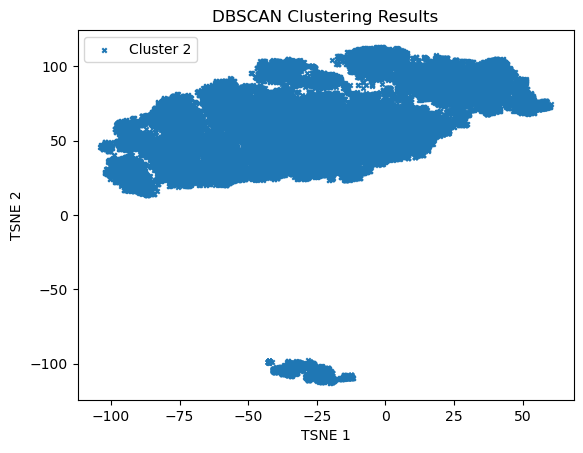

In [48]:
for name, group in clustered_groups:
    if name == 2:
        plt.scatter(group['tsne_1'], group['tsne_2'], label=f'Cluster {name}', marker='x', s=10)


plt.xlabel('TSNE 1')
plt.ylabel('TSNE 2')
plt.title('DBSCAN Clustering Results')
plt.legend()
plt.show()

In [23]:
db_score = davies_bouldin_scorer(dbscan, scaled_data)

In [24]:
db_score

1.377356010497468

In [81]:
result_df = pd.DataFrame()

for idx, group in clustered_groups:
    # 使用 ast.literal_eval 將字串表示的列表轉換為 Python 列表
    all_genres = [genre.strip() for sublist in group['genres'] for genre in ast.literal_eval(sublist)]

    # 計算每個 genres 的出現次數
    genre_counts = Counter(all_genres)

    # 找出出現次數最多的前五個 genres
    top_genres = genre_counts.most_common(5)
    genres = [genre for genre, count in top_genres]

    # 將結果添加到 DataFrame 中
    result_df[f'Cluster {idx}'] = pd.Series(genres)

In [82]:
result_df

,Cluster--1,Cluster-0,Cluster-1,Cluster-2,Cluster-3,Cluster-4,Cluster-5,Cluster-6,Cluster-7,Cluster-8,...,Cluster-10,Cluster-11,Cluster-12,Cluster-13,Cluster-14,Cluster-15,Cluster-16,Cluster-17,Cluster-18,Cluster-19
0,jazz,rock,rock,classical,classic arab pop,album rock,jazz,classic arab pop,afrobeat,sleep,...,album rock,comedy,meditation,environmental,environmental,album rock,environmental,hard bop,classical,clean comedy
1,rock,classic rock,classical,white noise,microtonal,classic rock,vocal jazz,microtonal,afropop,environmental,...,classic rock,clean comedy,432hz,sleep,sleep,classic rock,sleep,jazz,american modern classical,black comedy
2,classical,classical,rap,sleep,NaN,rock,adult standards,arab folk,world,spa,...,progressive rock,black comedy,ambient,water,ocean,hard rock,sound,soul,orchestral performance,NaN
3,classic rock,singer-songwriter,classic rock,opera,NaN,hard rock,big band,belly dance,british blues,color noise,...,rock,deep comedy,art pop,ocean,birdsong,progressive rock,water,album rock,american orchestra,NaN
4,vocal jazz,album rock,jazz,adult standards,NaN,mellow gold,dixieland,NaN,classic soul,ocean,...,canadian metal,easy listening,art rock,rain,sound,art rock,ocean,classic rock,orchestra,NaN


In [86]:
dbscan = DBSCAN(eps=1.6, min_samples=5)
clusters = dbscan.fit_predict(scaled_data)

db_score = davies_bouldin_scorer(dbscan, scaled_data)
db_score

1.3845981625728419

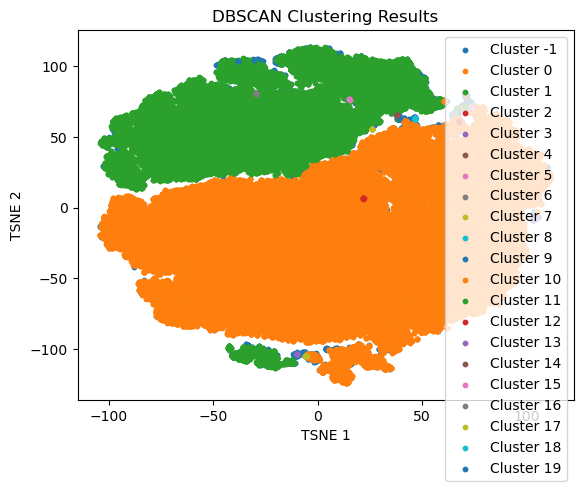

In [87]:
data_with_clusters = df_tsne.copy()
data_with_clusters['Cluster'] = clusters

clustered_groups = data_with_clusters.groupby('Cluster')

for name, group in clustered_groups:
    plt.scatter(group['tsne_1'], group['tsne_2'], label=f'Cluster {name}', marker='o', s=10)

plt.xlabel('TSNE 1')
plt.ylabel('TSNE 2')
plt.title('DBSCAN Clustering Results')
plt.legend()
plt.show()

In [88]:
result_df = pd.DataFrame()

for idx, group in clustered_groups:
    # 使用 ast.literal_eval 將字串表示的列表轉換為 Python 列表
    all_genres = [genre.strip() for sublist in group['genres'] for genre in ast.literal_eval(sublist)]

    # 計算每個 genres 的出現次數
    genre_counts = Counter(all_genres)

    # 找出出現次數最多的前五個 genres
    top_genres = genre_counts.most_common(5)
    genres = [genre for genre, count in top_genres]

    # 將結果添加到 DataFrame 中
    result_df[f'Cluster {idx}'] = pd.Series(genres)

result_df

,Cluster -1,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6,Cluster 7,Cluster 8,...,Cluster 10,Cluster 11,Cluster 12,Cluster 13,Cluster 14,Cluster 15,Cluster 16,Cluster 17,Cluster 18,Cluster 19
0,rock,rock,rock,classical,classical,classic arab pop,classical,album rock,jazz,sleep,...,classical,album rock,canadian hip hop,comedy,environmental,jazz,afrobeat,comedy,environmental,classic rock
1,jazz,classic rock,classical,early modern classical,white noise,microtonal,classical performance,british blues,vocal jazz,environmental,...,orchestra,art rock,canadian trap,black comedy,sleep,bebop,afropop,clean comedy,sleep,country rock
2,classical,classical,rap,late romantic era,sleep,NaN,orchestra,classic rock,adult standards,spa,...,orchestral performance,blues rock,melodic rap,comic,water,hard bop,world,comic,sound,folk
3,classic rock,singer-songwriter,classic rock,classical performance,opera,NaN,orchestral performance,country rock,big band,color noise,...,american modern classical,classic rock,rap,clean comedy,ocean,cool jazz,NaN,new comedy,water,folk rock
4,album rock,album rock,hip hop,classical piano,adult standards,NaN,german romanticism,folk rock,dixieland,ocean,...,american orchestra,folk rock,trap,new comedy,NaN,blues rock,NaN,NaN,ocean,rock


In [95]:
data_with_clusters['Cluster'].value_counts()

Cluster
 0     118957
 1      48633
-1       2933
 3         22
 4         13
 13         9
 9          8
 5          8
 10         8
 7          8
 17         7
 18         6
 12         5
 14         5
 11         5
 8          5
 16         5
 6          5
 15         4
 2          4
 19         3
Name: count, dtype: int64

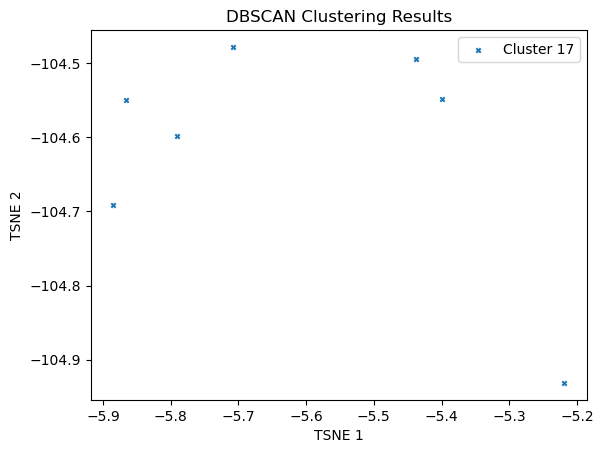

In [104]:
for name, group in clustered_groups:
    if name == 17:
        plt.scatter(group['tsne_1'], group['tsne_2'], label=f'Cluster {name}', marker='x', s=10)


plt.xlabel('TSNE 1')
plt.ylabel('TSNE 2')
plt.title('DBSCAN Clustering Results')
plt.legend()
plt.show()

In [75]:
# normalized_data
nbrs = NearestNeighbors(n_neighbors=5).fit(normalized_data)

# 計算每個樣本的最近鄰居距離
distances, indices = nbrs.kneighbors(normalized_data)

# 將距離排序
distances = np.sort(distances, axis=0)

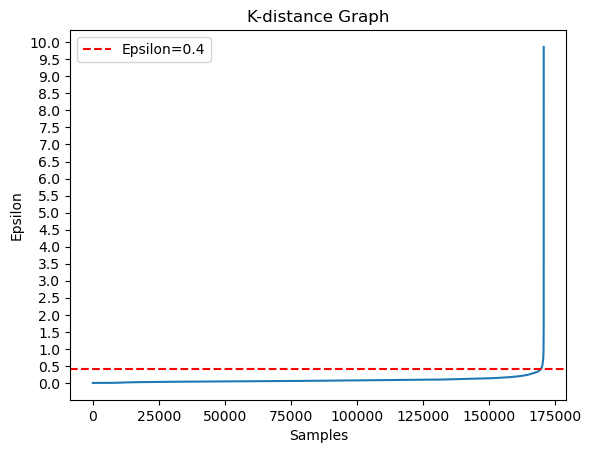

In [80]:
max_y = np.ceil(np.max(distances))  
y_ticks = np.arange(0, max_y + 0.5, 0.5)
plt.yticks(y_ticks)

# 計算K距離圖
plt.plot(distances[:, 1])
plt.axhline(y=0.4, color='r', linestyle='--', label='Epsilon=0.4')
plt.xlabel('Samples')
plt.ylabel('Epsilon')
plt.title('K-distance Graph')
plt.legend()
plt.show()

In [81]:
dbscan = DBSCAN(eps=0.4, min_samples=5)
clusters = dbscan.fit_predict(normalized_data)

data_with_clusters = df_tsne.copy()
data_with_clusters['Cluster'] = clusters

clustered_groups = data_with_clusters.groupby('Cluster')

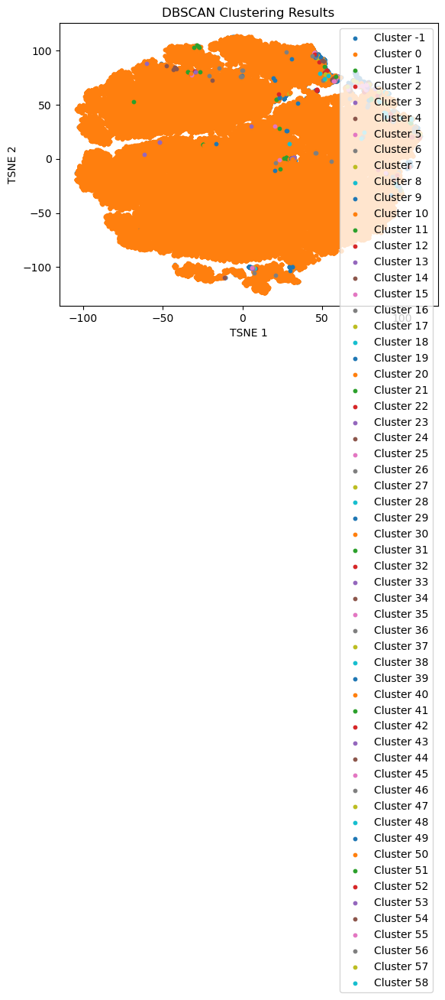

In [82]:
for name, group in clustered_groups:
    plt.scatter(group['tsne_1'], group['tsne_2'], label=f'Cluster {name}', marker='o', s=10)

plt.xlabel('TSNE 1')
plt.ylabel('TSNE 2')
plt.title('DBSCAN Clustering Results')
plt.legend()
plt.show()

## GMM

In [5]:
select_variables = ['duration_ms', 'key', 'loudness', 'tempo',
                    'valence', 'acousticness', 'danceability', 
                    'energy', 'instrumentalness',
                    'liveness', 'mode', 'speechiness']

In [ ]:
def davies_bouldin_scorer(estimator, X):
    clusters = estimator.fit_predict(X)
    score = davies_bouldin_score(X, clusters)
    return score

def silhouette_scorer(estimator, X):
    clusters = estimator.fit_predict(X)
    score = silhouette_score(X, clusters)
    return score

bics = [4060019.3326927368, 3798033.758522909, 2601437.2074166774, 2430299.897131408, 1670675.565942982,
 1665940.1720482884, 1542732.538056183,
 1522892.4573482266,
 1424116.9811920146,1162661.907074706,
 1180414.3959421245,
 1061254.3347848651,
 989241.9202769703,
 990855.5698233112,
 982199.6137454927,
 1023641.4705741453,
 907805.2283543574,
 883005.7148540022,
 822543.9687554287, 838821.4756428646,
 827283.5677033081,
 822969.322185415,
 771401.2101982605,
 763785.6821389688,
 759116.7693062857,
 740673.5375968121,
 709942.1470304511,
 738716.991216153,
 703242.1840072332, 709803.4426324725,
 654397.8077025004,
 689628.0180203229,
 656531.104002775,
 674902.7799896437]

In [ ]:
# bics = []
n_components_range = range(2, 36)  # 集群數量的範圍，例如 1 到 10

for n_components in n_components_range:
    gmm = GaussianMixture(n_components=n_components, random_state=0)
    gmm.fit(scaled_df)
    bics.append(gmm.bic(scaled_df))

# 找到 BIC 分數最低的集群數量
best_n_components = n_components_range[bics.index(min(bics))]
print("最佳集群數量:", best_n_components)

In [3]:
best_n_components = 32

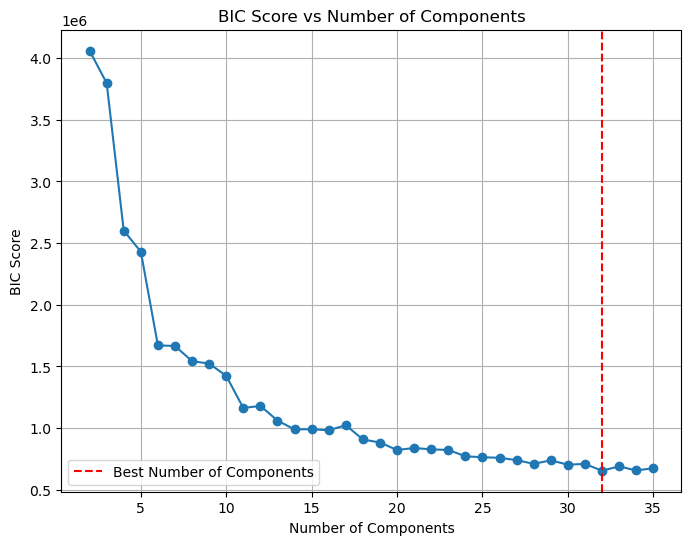

In [7]:
plt.figure(figsize=(8, 6))
plt.plot(n_components_range, bics, marker='o', linestyle='-')
plt.xlabel('Number of Components')
plt.ylabel('BIC Score')
plt.title('BIC Score vs Number of Components')
plt.axvline(x=best_n_components, color='r', linestyle='--', label='Best Number of Components')
plt.legend()
plt.grid(True)
plt.show()

In [9]:
gmm = GaussianMixture(n_components = best_n_components, random_state=42)

# 訓練模型
gmm.fit(scaled_df)

GaussianMixture(n_components=32, random_state=42)

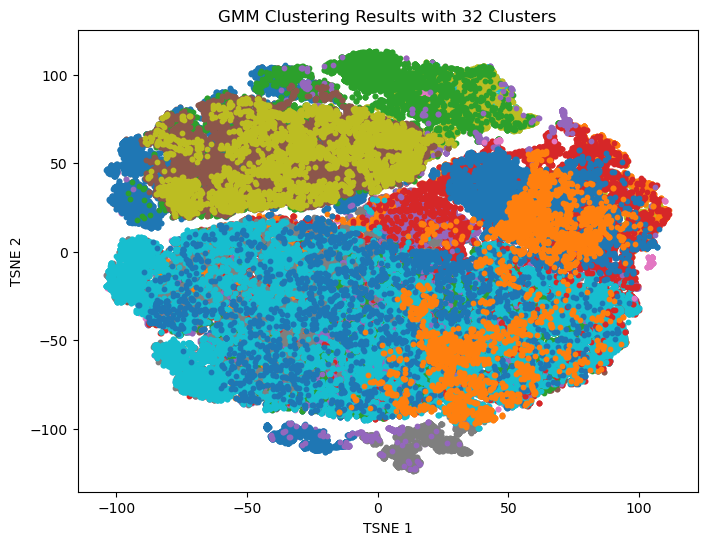

In [10]:
data_with_clusters = df_tsne.copy()
data_with_clusters['Cluster'] = gmm.predict(scaled_df)

# 按照群數進行分組
clustered_groups = data_with_clusters.groupby('Cluster')

# 繪製分群結果
plt.figure(figsize=(8, 6))
for name, group in clustered_groups:
    plt.scatter(group['tsne_1'], group['tsne_2'], label=f'Cluster {name}', marker='o', s=10)

plt.xlabel('TSNE 1')
plt.ylabel('TSNE 2')
plt.title(f'GMM Clustering Results with {best_n_components} Clusters')
# plt.legend()
plt.show() 

In [70]:
data_with_clusters['Cluster'].value_counts()

Cluster
10    19664
12    19593
25    15911
29    10814
20     9057
30     7238
22     7029
19     6353
13     6108
7      5986
3      5106
1      4940
23     4707
14     4679
31     4468
8      4219
28     3924
5      3896
18     3766
21     3630
6      3507
15     2649
11     2625
27     2577
9      2533
2      2382
0      2262
24      507
16      187
4       118
17      117
26      101
Name: count, dtype: int64

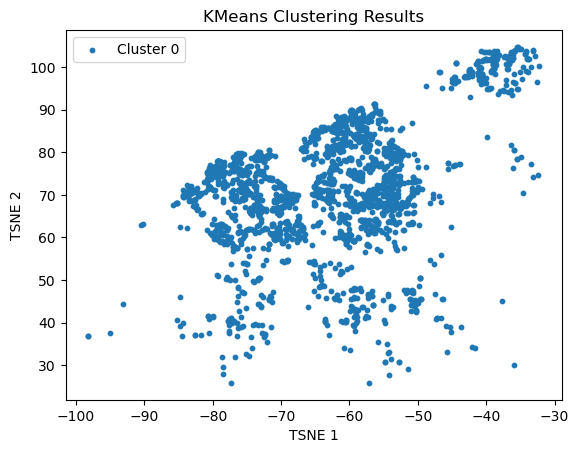

In [85]:
for name, group in clustered_groups:
    if name == 0: 
        plt.scatter(group['tsne_1'], group['tsne_2'], label=f'Cluster {name}', marker='o', s=10)

plt.xlabel('TSNE 1')
plt.ylabel('TSNE 2')
plt.title('KMeans Clustering Results')
plt.legend()
plt.show()

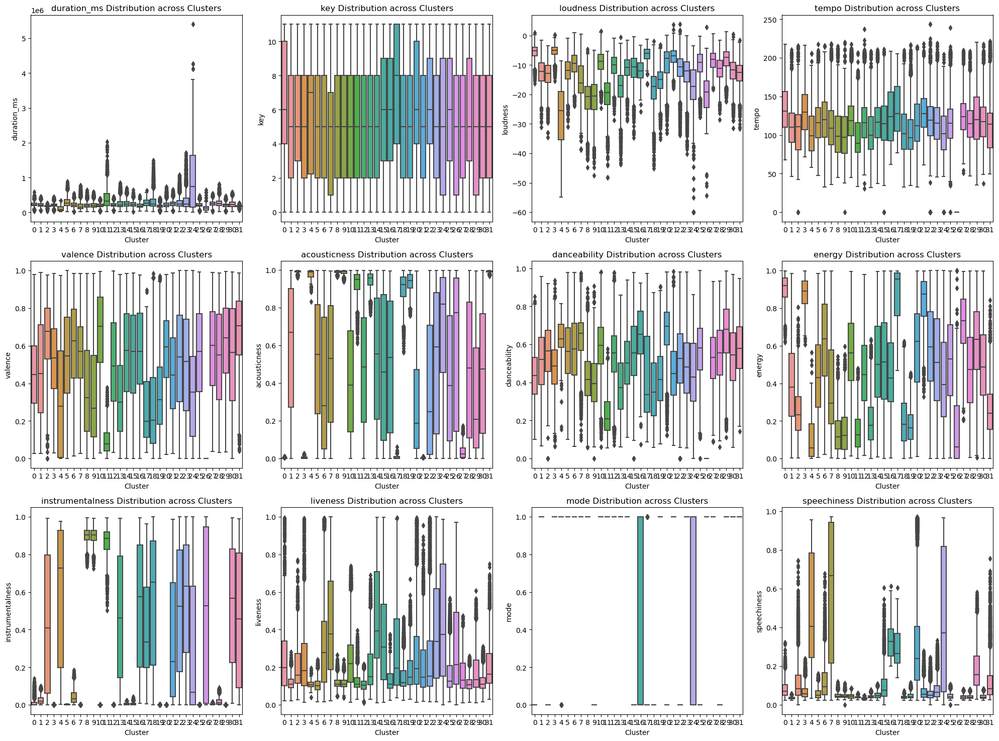

In [86]:
n_rows = 3
n_cols = 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# 迴圈遍歷每個變數
for i, var in enumerate(select_variables):
    # 計算子圖的位置
    row = i // n_cols
    col = i % n_cols
    
    # 繪製盒狀圖
    sns.boxplot(x='Cluster', y=var, data=data_with_clusters, ax=axes[row, col])
    axes[row, col].set_title(f'{var} Distribution across Clusters')
    axes[row, col].set_xlabel('Cluster')
    axes[row, col].set_ylabel(var)

# 隱藏多餘的子圖
for i in range(len(select_variables), n_rows * n_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

In [14]:
result_df = pd.DataFrame()

for idx, group in clustered_groups:
    # 處理genres欄位
    genres_list = []
    for sublist in group['genres']:
        if isinstance(sublist, str) and sublist != 'unknown':
            genres_list.extend(ast.literal_eval(sublist))
        elif isinstance(sublist, list):
            genres_list.extend(sublist)
    
    # 計算每個 genres 的出現次數
    genre_counts = Counter(genres_list)

    # 找出出現次數最多的前五個 genres
    top_genres = genre_counts.most_common(50)
    genres = [genre for genre, count in top_genres]

    # 將結果添加到 DataFrame 中
    result_df[f'Cluster {idx}'] = pd.Series(genres)

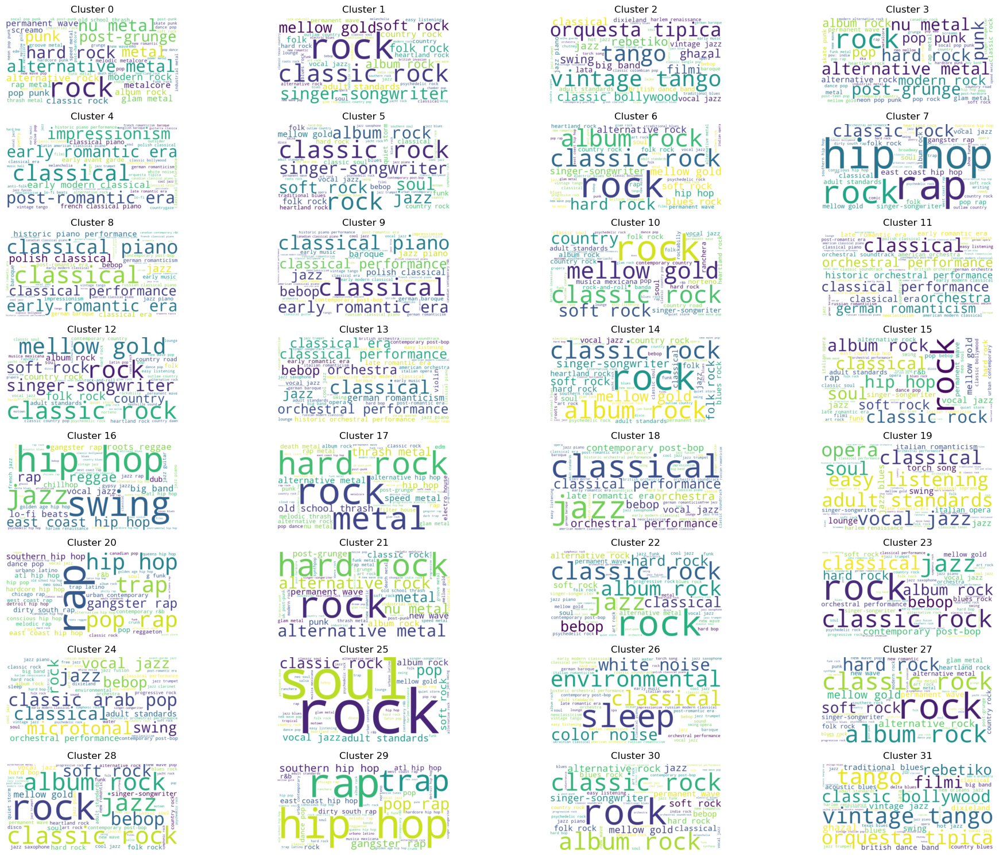

In [15]:
n_rows = 8
n_cols = 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# 迴圈遍歷每一群
for idx, ax in enumerate(axes.flatten()):
    # 獲取該群的genres列表
    genres_list = result_df[f'Cluster {idx}'].dropna().tolist()
    
    # 計算每個類別的出現次數
    genre_counts = Counter(genres_list)
    
    # 生成文字雲，設置類別字體大小為其出現次數
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', collocations=False)
    wordcloud.generate_from_frequencies(genre_counts)
    
    # 繪製文字雲
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(f'Cluster {idx}')
    ax.axis('off')
    
plt.tight_layout()
plt.show()

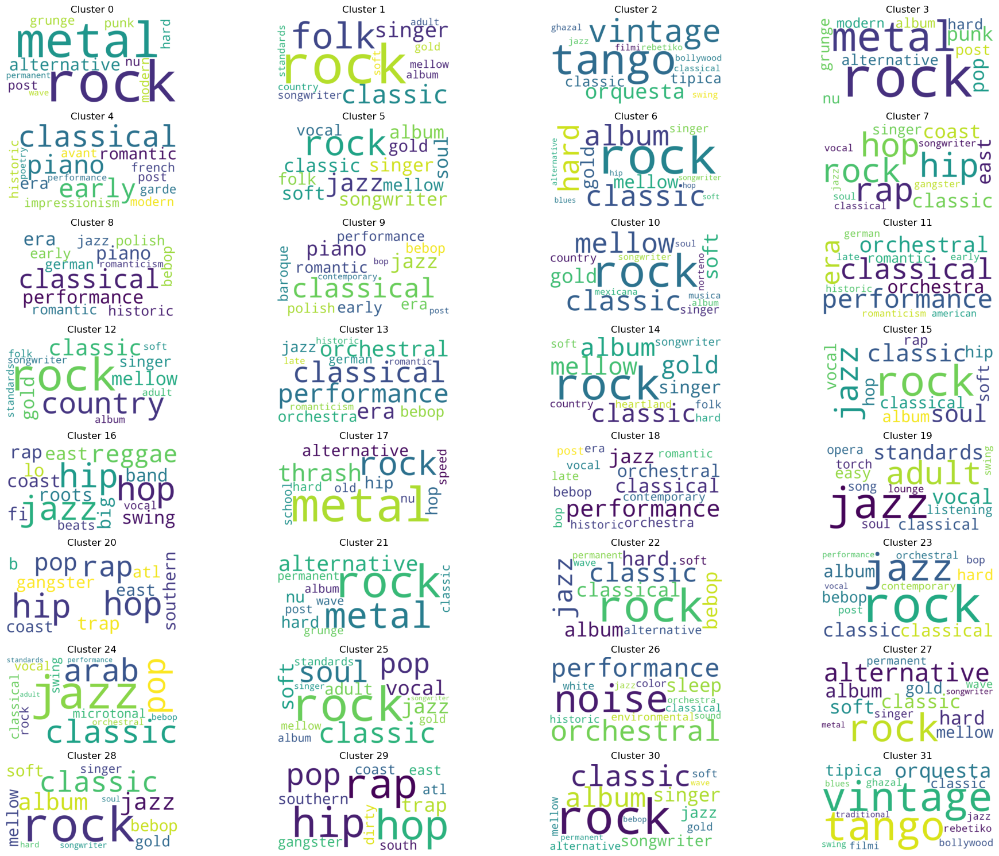

In [87]:
n_rows = 8
n_cols = 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# 迴圈遍歷每一群
for idx, ax in enumerate(axes.flatten()):
    # 獲取該群的genres列表
    genres_list = result_df[f'Cluster {idx}'].dropna().tolist()
    
    # 生成文字雲，設置 collocations 為 False
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', collocations=False).generate(' '.join(genres_list))
    
    # 繪製文字雲
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(f'Cluster {idx}')
    ax.axis('off')
    
plt.tight_layout()
plt.show()

## K-Means

range(2,21):

silhouette_scores = 
[0.18702414726298744,
 0.2039638299241504,
 0.1551158478613692,
 0.1486864831109163,
 0.1363570704130624,
 0.14041686009647372,
 0.14411764559496204,
 0.13327229273875513,
 0.13163957399827106,
 0.1343405149918556,
 0.13006716187703257,
 0.1316219245726418,
 0.125424786251459,
 0.11920685123189127,
 0.12274468152382127,
 0.12286934522943159,
 0.12672865148799398,
 0.12408952588621637,
 0.12346793042588267]

davies_bouldin_scores = [2.0100356790477316,
 1.6176832278023887,
 1.801956123816527,
 1.9299001746839555,
 1.9210667887517552,
 1.8056997136754127,
 1.7083375818788586,
 1.7470980157012646,
 1.740042442408182,
 1.7183345191034816,
 1.6951755180293622,
 1.7702628370797042,
 1.795879427355102,
 1.7124713529083884,
 1.7142287709762671,
 1.772867280371686,
 1.810598678975528,
 1.777635464698828,
 1.784199862423208]

In [15]:
# 初始化空列表，用於存儲不同 K 值的輪廓系數和戴維斯-布爾丁指數
# silhouette_scores = []
# davies_bouldin_scores = []

# 嘗試不同的 K 值
for k in range(20, 21): # range(20,26)
    # 初始化 KMeans 模型
    kmeans = KMeans(n_clusters=k, random_state=42)
    
    # 使用 silhouette_scorer 函數計算輪廓系數
    silhouette_score_k = silhouette_scorer(kmeans, scaled_data)
    silhouette_scores.append(silhouette_score_k)
    
    # 使用 davies_bouldin_scorer 函數計算戴維斯-布爾丁指數
    davies_bouldin_score_k = davies_bouldin_scorer(kmeans, scaled_data)
    davies_bouldin_scores.append(davies_bouldin_score_k)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


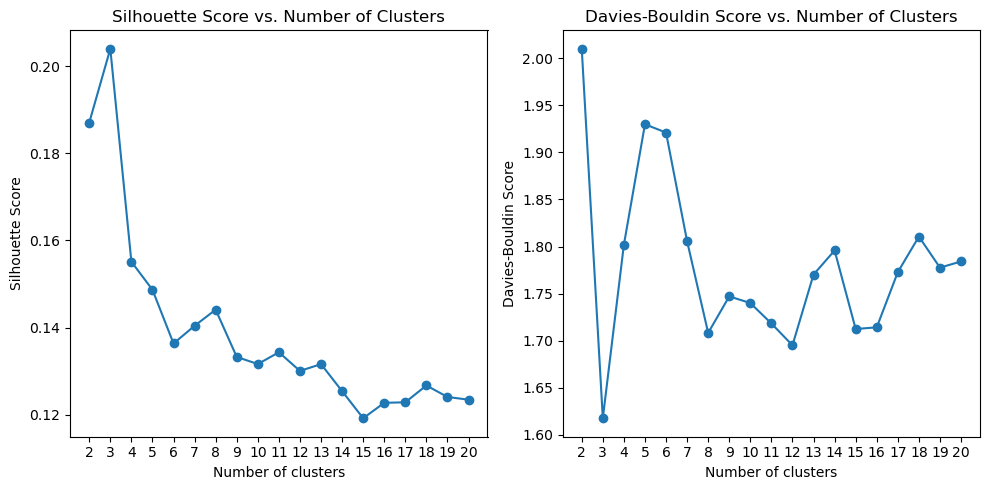

In [16]:
# 繪製曲線圖
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.plot(range(2, 21), silhouette_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. Number of Clusters')
plt.xticks(range(2, 21))  # Set x-axis ticks to integers

plt.subplot(1, 2, 2)
plt.plot(range(2, 21), davies_bouldin_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Davies-Bouldin Score')
plt.title('Davies-Bouldin Score vs. Number of Clusters')
plt.xticks(range(2, 21))  # Set x-axis ticks to integers

plt.tight_layout()
plt.show()

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


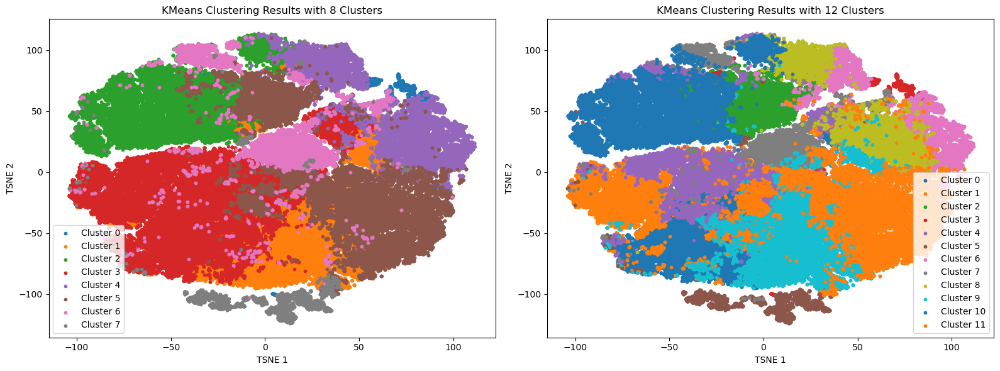

In [6]:
num_clusters_to_view = [8, 12]

n_rows = 1
n_cols = 2
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 6))  # 設定子圖的大小

# 迴圈遍歷要查看的群數
for idx, num_clusters in enumerate(num_clusters_to_view):
    # 初始化 KMeans 模型，設定群數
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    
    # 使用 KMeans 模型對資料進行分群
    clusters = kmeans.fit_predict(scaled_data)

    data_with_clusters = df_tsne.copy()
    data_with_clusters['Cluster'] = clusters

    # 按照群數進行分組
    clustered_groups = data_with_clusters.groupby('Cluster')

    # 繪製分群結果
    ax = axes[idx]  # 獲取當前子圖
    for name, group in clustered_groups:
        ax.scatter(group['tsne_1'], group['tsne_2'], label=f'Cluster {name}', marker='o', s=10)

    ax.set_xlabel('TSNE 1')
    ax.set_ylabel('TSNE 2')
    ax.set_title(f'KMeans Clustering Results with {num_clusters} Clusters')
    ax.legend()

plt.tight_layout()  # 自動調整子圖的間距
plt.show()

In [16]:
# 初始化 KMeans 模型，設定群數為 8
kmeans = KMeans(n_clusters=8, random_state=42)

# 使用 KMeans 模型對資料進行分群
clusters = kmeans.fit_predict(scaled_data)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [17]:
data_with_clusters = df_tsne.copy()
data_with_clusters['Cluster'] = clusters

# 按照群數進行分組
clustered_groups = data_with_clusters.groupby('Cluster')

In [18]:
# 定義函數來計算空白genres的比例
def calculate_unknown_genres_ratio(group):
    # 計算 "unknown" genres 的數量
    unknown_genres_count = (group['genres'] == 'unknown').sum()
    # 計算 "unknown" genres 的比例
    unknown_genres_ratio = unknown_genres_count / len(group)
    return unknown_genres_ratio

# 使用 apply 函數計算每一組群集中 "unknown" genres 的比例
unknown_genres_ratios = clustered_groups.apply(calculate_unknown_genres_ratio)

# 輸出結果
print(unknown_genres_ratios)

Cluster
0    0.048976
1    0.109673
2    0.039611
3    0.028470
4    0.114920
5    0.084922
6    0.066680
7    0.760337
dtype: float64


In [19]:
data_with_clusters['Cluster'].value_counts().sort_index()

Cluster
0     2001
1    30974
2    27846
3    44959
4    19779
5    29686
6    10063
7     5345
Name: count, dtype: int64

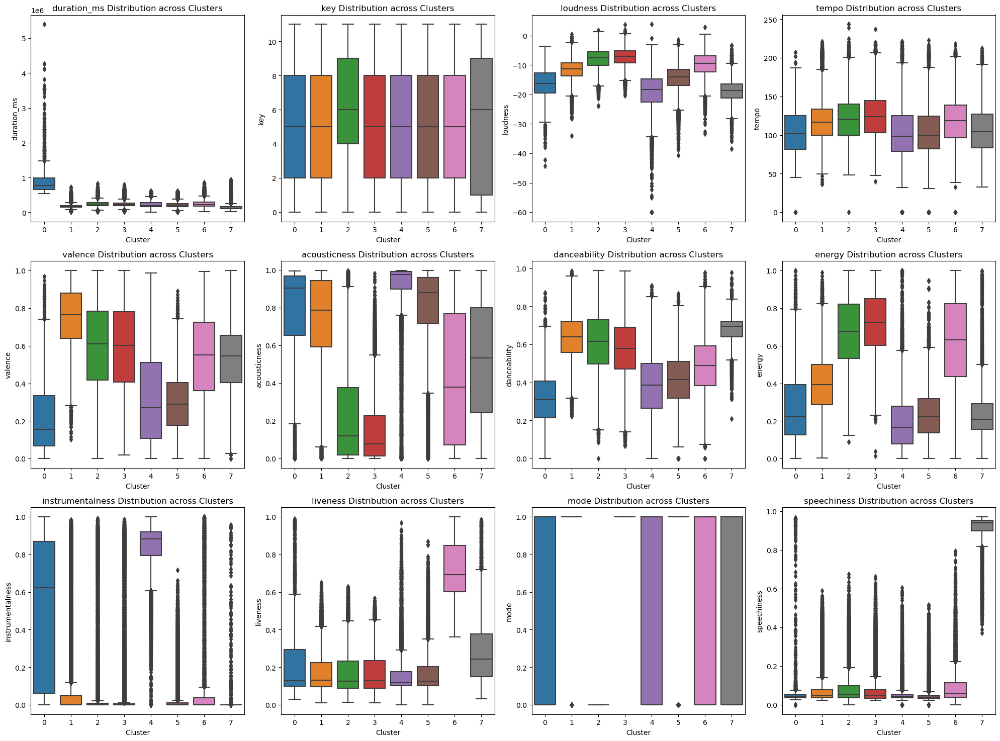

In [20]:
n_rows = 3
n_cols = 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# 迴圈遍歷每個變數
for i, var in enumerate(select_variables):
    # 計算子圖的位置
    row = i // n_cols
    col = i % n_cols
    
    # 繪製盒狀圖
    sns.boxplot(x='Cluster', y=var, data=data_with_clusters, ax=axes[row, col])
    axes[row, col].set_title(f'{var} Distribution across Clusters')
    axes[row, col].set_xlabel('Cluster')
    axes[row, col].set_ylabel(var)

# 隱藏多餘的子圖
for i in range(len(select_variables), n_rows * n_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

In [21]:
result_df = pd.DataFrame()

for idx, group in clustered_groups:
    # 處理genres欄位
    genres_list = []
    for sublist in group['genres']:
        if isinstance(sublist, str) and sublist != 'unknown':
            genres_list.extend(ast.literal_eval(sublist))
        elif isinstance(sublist, list):
            genres_list.extend(sublist)
    
    # 計算每個 genres 的出現次數
    genre_counts = Counter(genres_list)

    # 找出出現次數最多的前五個 genres
    top_genres = genre_counts.most_common(10)
    genres = [genre for genre, count in top_genres]

    # 將結果添加到 DataFrame 中
    result_df[f'Cluster {idx}'] = pd.Series(genres)

result_df

,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6,Cluster 7
0,classical,vintage tango,rock,rock,classical,adult standards,rock,writing
1,orchestral performance,vocal jazz,rap,classic rock,classical performance,vocal jazz,classic rock,guidance
2,classical performance,adult standards,hip hop,album rock,jazz,classical,album rock,motivation
3,orchestra,soul,classic rock,hard rock,early romantic era,singer-songwriter,hard rock,poetry
4,german romanticism,tango,pop,rap,classical piano,easy listening,mellow gold,comedy
5,historic orchestral performance,singer-songwriter,album rock,soft rock,orchestral performance,soft rock,singer-songwriter,rap
6,jazz,classic rock,hard rock,mellow gold,orchestra,classic rock,soft rock,hip hop
7,early romantic era,orquesta tipica,soft rock,hip hop,bebop,mellow gold,folk rock,comic
8,late romantic era,jazz,trap,singer-songwriter,early modern classical,jazz,heartland rock,classical
9,classical era,rock,pop rap,pop,classical era,soul,soul,vocal jazz


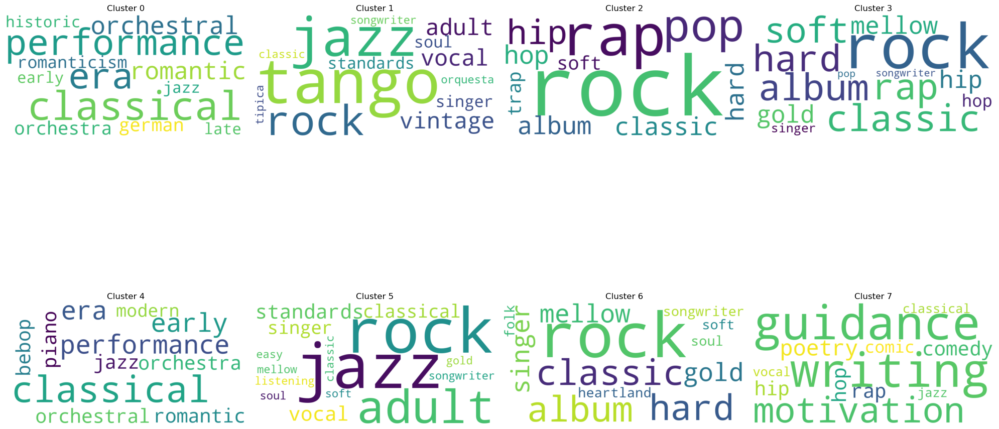

In [23]:
n_rows = 2
n_cols = 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# 迴圈遍歷每一群
for idx, ax in enumerate(axes.flatten()):
    # 獲取該群的genres列表
    genres_list = result_df[f'Cluster {idx}'].dropna().tolist()
    
    # 生成文字雲，設置 collocations 為 False
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', collocations=False).generate(' '.join(genres_list))
    
    # 繪製文字雲
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(f'Cluster {idx}')
    ax.axis('off')
    
plt.tight_layout()
plt.show()

In [4]:
# 初始化 KMeans 模型，設定群數為 12
kmeans = KMeans(n_clusters=12, random_state=42)

# 使用 KMeans 模型對資料進行分群
clusters = kmeans.fit_predict(scaled_data)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [79]:
data_with_clusters = df.copy()
data_with_clusters['Cluster'] = clusters

# 按照群數進行分組
clustered_groups = data_with_clusters.groupby('Cluster')

In [71]:
# 定義函數來計算空白genres的比例
def calculate_unknown_genres_ratio(group):
    # 計算 "unknown" genres 的數量
    unknown_genres_count = (group['genres'] == 'unknown').sum()
    # 計算 "unknown" genres 的比例
    unknown_genres_ratio = unknown_genres_count / len(group)
    return unknown_genres_ratio

# 使用 apply 函數計算每一組群集中 "unknown" genres 的比例
unknown_genres_ratios = clustered_groups.apply(calculate_unknown_genres_ratio)

# 輸出結果
print(unknown_genres_ratios)

Cluster
0     0.0
1     0.0
2     0.0
3     0.0
4     0.0
5     0.0
6     0.0
7     0.0
8     0.0
9     0.0
10    0.0
11    0.0
dtype: float64


In [14]:
data_with_clusters['Cluster'].value_counts().sort_index()

Cluster
0     20401
1     19384
2     13564
3      1442
4     15847
5      5299
6     12728
7      8945
8     11629
9     19340
10    21412
11    20662
Name: count, dtype: int64

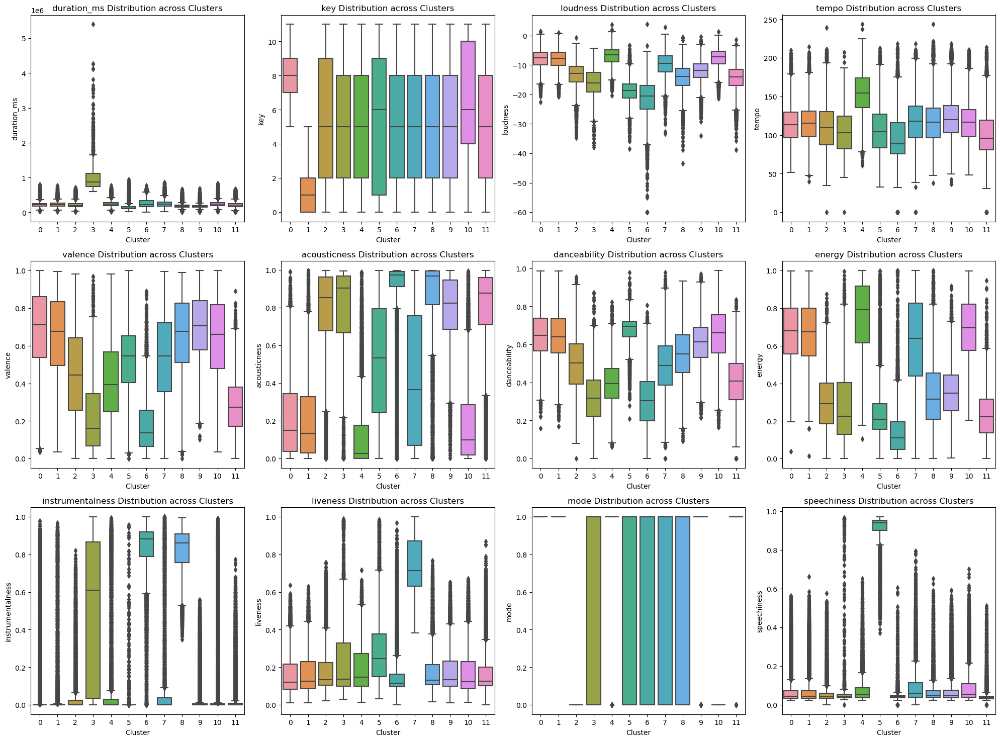

In [10]:
n_rows = 3
n_cols = 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# 迴圈遍歷每個變數
for i, var in enumerate(select_variables):
    # 計算子圖的位置
    row = i // n_cols
    col = i % n_cols
    
    # 繪製盒狀圖
    sns.boxplot(x='Cluster', y=var, data=data_with_clusters, ax=axes[row, col])
    axes[row, col].set_title(f'{var} Distribution across Clusters')
    axes[row, col].set_xlabel('Cluster')
    axes[row, col].set_ylabel(var)

# 隱藏多餘的子圖
for i in range(len(select_variables), n_rows * n_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

In [53]:
result_df = pd.DataFrame()

for idx, group in clustered_groups:
    # 處理genres欄位
    genres_list = []
    for sublist in group['genres']:
        if isinstance(sublist, str) and sublist != 'unknown':
            genres_list.extend(ast.literal_eval(sublist))
        elif isinstance(sublist, list):
            genres_list.extend(sublist)
    
    # 計算每個 genres 的出現次數
    genre_counts = Counter(genres_list)

    # 找出出現次數最多的前五個 genres
    top_genres = genre_counts.most_common(50)
    genres = [genre for genre, count in top_genres]

    # 將結果添加到 DataFrame 中
    result_df[f'Cluster {idx}'] = pd.Series(genres)

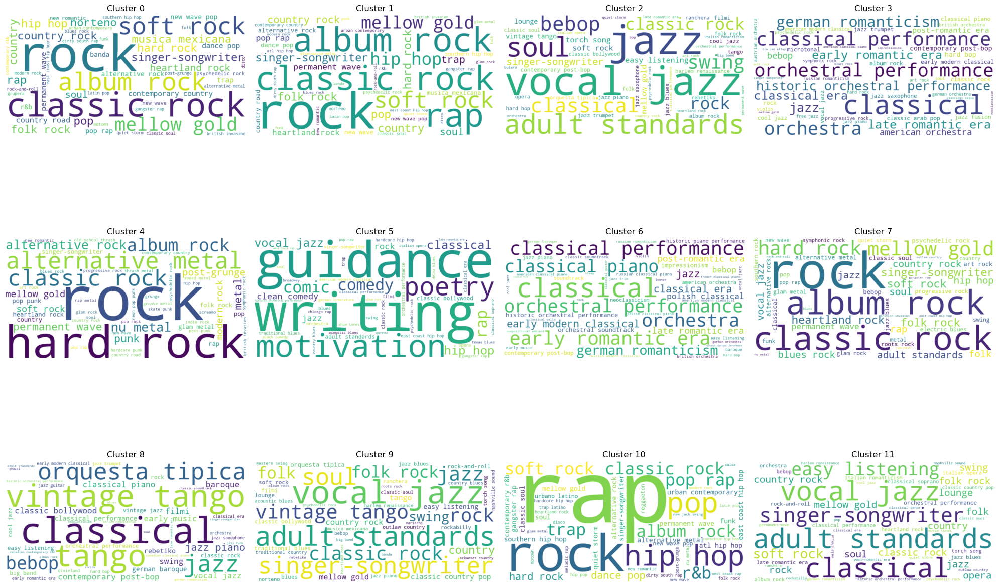

In [54]:
n_rows = 3
n_cols = 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# 迴圈遍歷每一群
for idx, ax in enumerate(axes.flatten()):
    # 獲取該群的genres列表
    genres_list = result_df[f'Cluster {idx}'].dropna().tolist()
    
    # 計算每個類別的出現次數
    genre_counts = Counter(genres_list)
    
    # 生成文字雲，設置類別字體大小為其出現次數
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', collocations=False)
    wordcloud.generate_from_frequencies(genre_counts)
    
    # 繪製文字雲
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(f'Cluster {idx}')
    ax.axis('off')
    
plt.tight_layout()
plt.show()

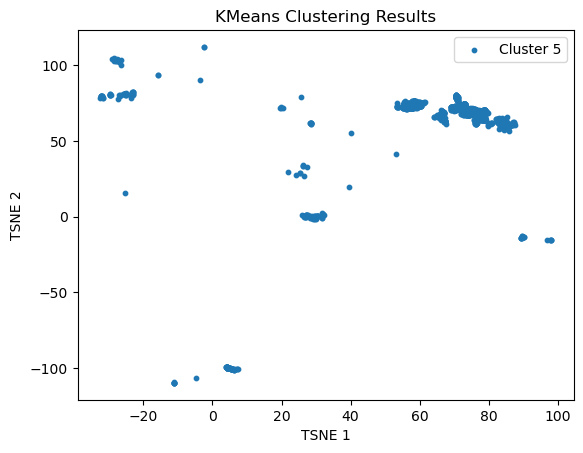

In [32]:
for name, group in clustered_groups:
    if name == 5: # Cluster 0-14
        plt.scatter(group['tsne_1'], group['tsne_2'], label=f'Cluster {name}', marker='o', s=10)

plt.xlabel('TSNE 1')
plt.ylabel('TSNE 2')
plt.title('KMeans Clustering Results')
plt.legend()
plt.show()

In [60]:
data_with_clusters['Cluster'].value_counts().sort_index()

Cluster
0      8605
1     19725
2     12626
3     12658
4      5274
5      1221
6     12618
7     10909
8     10181
9      8180
10    14792
11    12453
12    16727
13    12430
14    12254
Name: count, dtype: int64

In [81]:
data_with_clusters = data_with_clusters.drop(columns=['year','release_date', 'explicit'])

In [83]:
data_with_clusters.to_csv('df-cluster.csv', index=False)  # 如果不想將索引保存到CSV中，設置index=False

#### normalize

range(2, 21):

silhouette_scores = [0.22120214611543482,
 0.2247840637855139,
 0.23694043098028567,
 0.238753774973532,
 0.20888757188893697,
 0.2146147520024522,
 0.20956278902802325,
 0.19799894637861173,
 0.20208148877973142,
 0.1979894474521134,
 0.19953476901554384,
 0.19491007660665913,
 0.19765582393989134,
 0.18899432678916056,
 0.19002376529063192,
 0.1924564261172577,
 0.193261495029921,
 0.1918307541929422,
 0.19476961605170987]

davies_bouldin_scores = [1.7833143788148742,
 1.4515120005448783,
 1.2753297274169495,
 1.1706605937097772,
 1.2525803909233162,
 1.1709910425182248,
 1.2096734827565285,
 1.2282309893248904,
 1.1835529353787078,
 1.2209868215850284,
 1.1987646707021677,
 1.2056566515983453,
 1.1668819529400352,
 1.2007824267180354,
 1.2326909813983407,
 1.232146922729181,
 1.201085415625037,
 1.186181800389489,
 1.1662064456474426]

In [89]:
#silhouette_scores = []
#davies_bouldin_scores = []

for k in range(16, 21): 
    # 初始化 KMeans 模型
    kmeans = KMeans(n_clusters=k, random_state=42)
    
    # 使用 silhouette_scorer 函數計算輪廓系數
    silhouette_score_k = silhouette_scorer(kmeans, normalized_data)
    silhouette_scores.append(silhouette_score_k)
    
    # 使用 davies_bouldin_scorer 函數計算戴維斯-布爾丁指數
    davies_bouldin_score_k = davies_bouldin_scorer(kmeans, normalized_data)
    davies_bouldin_scores.append(davies_bouldin_score_k)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/

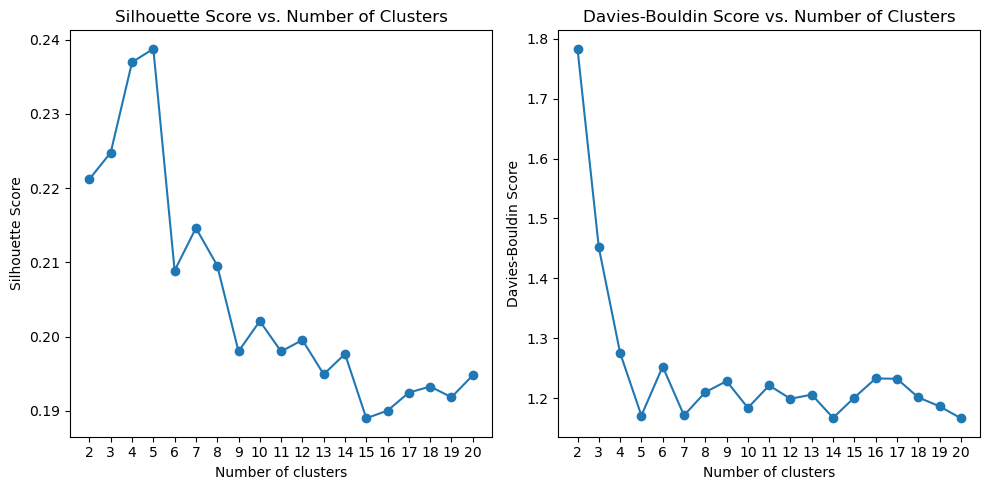

In [90]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.plot(range(2, 21), silhouette_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. Number of Clusters')
plt.xticks(range(2, 21))  # Set x-axis ticks to integers

plt.subplot(1, 2, 2)
plt.plot(range(2, 21), davies_bouldin_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Davies-Bouldin Score')
plt.title('Davies-Bouldin Score vs. Number of Clusters')
plt.xticks(range(2, 21))  # Set x-axis ticks to integers

plt.tight_layout()
plt.show()

In [94]:
kmeans = KMeans(n_clusters=15, random_state=42)

# 使用 KMeans 模型對資料進行分群
clusters = kmeans.fit_predict(normalized_data)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


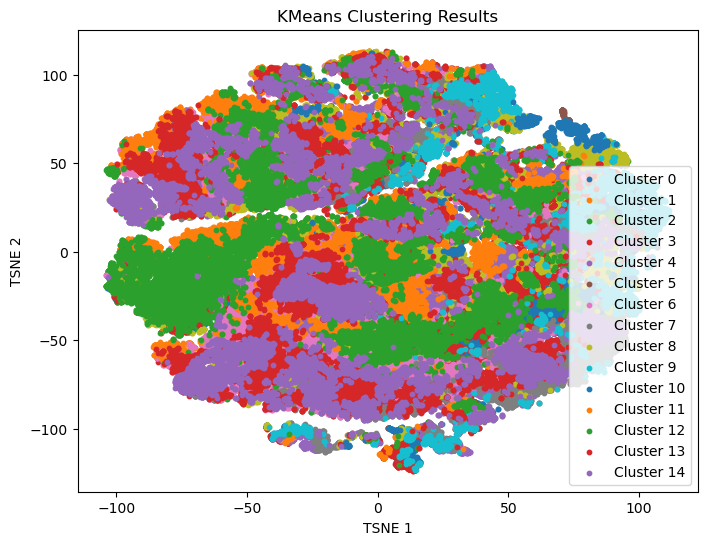

In [97]:
data_with_clusters = df_tsne.copy()
data_with_clusters['Cluster'] = clusters

clustered_groups = data_with_clusters.groupby('Cluster')

plt.figure(figsize=(8, 6))

for name, group in clustered_groups:
    plt.scatter(group['tsne_1'], group['tsne_2'], label=f'Cluster {name}', marker='o', s=10)

plt.xlabel('TSNE 1')
plt.ylabel('TSNE 2')
plt.title('KMeans Clustering Results')
plt.legend()
plt.show()

In [98]:
result_df = pd.DataFrame()

for idx, group in clustered_groups:
    # 使用 ast.literal_eval 將字串表示的列表轉換為 Python 列表
    all_genres = [genre.strip() for sublist in group['genres'] for genre in ast.literal_eval(sublist)]

    # 計算每個 genres 的出現次數
    genre_counts = Counter(all_genres)

    # 找出出現次數最多的前五個 genres
    top_genres = genre_counts.most_common(10)
    genres = [genre for genre, count in top_genres]

    # 將結果添加到 DataFrame 中
    result_df[f'Cluster {idx}'] = pd.Series(genres)

result_df

,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6,Cluster 7,Cluster 8,Cluster 9,Cluster 10,Cluster 11,Cluster 12,Cluster 13,Cluster 14
0,classical,rock,rock,classical,classical,classic arab pop,rock,classical,classical,classical,classical,rock,rock,rock,rock
1,adult standards,classic rock,rap,singer-songwriter,vocal jazz,microtonal,classic rock,adult standards,jazz,classical performance,classical performance,classic rock,classic rock,classic rock,hip hop
2,vocal jazz,rap,hip hop,jazz,singer-songwriter,classical,album rock,vocal jazz,bebop,classical piano,orchestral performance,album rock,album rock,album rock,rap
3,jazz,album rock,classic rock,vocal jazz,rock,orchestral performance,soft rock,jazz,rock,early romantic era,orchestra,hard rock,soft rock,hard rock,classic rock
4,easy listening,hard rock,album rock,classic rock,classic rock,orchestra,mellow gold,singer-songwriter,classical performance,orchestral performance,german romanticism,rap,hard rock,soft rock,pop
5,singer-songwriter,alternative metal,pop,rock,jazz,historic orchestral performance,singer-songwriter,classic rock,classic rock,post-romantic era,historic orchestral performance,mellow gold,mellow gold,mellow gold,east coast hip hop
6,classic rock,hip hop,hard rock,soft rock,adult standards,post-romantic era,hard rock,easy listening,orchestral performance,orchestra,jazz,soft rock,rap,rap,pop rap
7,soul,alternative rock,soft rock,adult standards,soft rock,classical performance,pop,soft rock,contemporary post-bop,early modern classical,early romantic era,singer-songwriter,singer-songwriter,pop,gangster rap
8,soft rock,singer-songwriter,mellow gold,vintage tango,mellow gold,rock,folk rock,soul,album rock,late romantic era,classical era,alternative metal,pop,singer-songwriter,album rock
9,rock,permanent wave,singer-songwriter,mellow gold,folk rock,american orchestra,rap,rock,orchestra,impressionism,late romantic era,hip hop,soul,soul,r&b


In [99]:
data_with_clusters['Cluster'].value_counts()

Cluster
6     18433
14    17981
12    17143
0     16045
13    15867
2     15201
7     13625
3     10862
11    10018
1      9923
4      9870
8      8302
9      5932
10     1315
5       136
Name: count, dtype: int64

## 取得單一用戶資料

In [36]:
import os

# from spotipy import Spotify
import spotipy
import spotipy.util as util
from spotipy.oauth2 import SpotifyOAuth, SpotifyClientCredentials
from spotipy.cache_handler import FlaskSessionCacheHandler

In [37]:
client_id=''
client_secret=''

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id=client_id,client_secret=client_secret))

In [273]:
def rec(user, playlist_id):
    test = get_features(user, playlist_id)
    result = cluster_user_data(test, df_c)
    
    print("Recommendation Songs:")
    print("\n")
    for index, row in result.iterrows():
        artists = ', '.join(row['artists']) if isinstance(row['artists'], list) else row['artists']
        song_name = row['name']
        song_id = row['id']
        recommendation = f"{artists} - {song_name}, https://open.spotify.com/track/{song_id}"
        print(recommendation)

In [274]:
rec('cccjbug', 'spotify:playlist:09IeIeKcAnnqUrogTXRqac')

Recommendation Songs:


['Taylor Swift'] - Love Story, https://open.spotify.com/track/1vrd6UOGamcKNGnSHJQlSt
['John Williams', 'London Symphony Orchestra'] - Luke and Leia, https://open.spotify.com/track/1HhLogd8ljnRgXM8FlAR8o
['Antonio Vivaldi', 'Itzhak Perlman', 'Israel Philharmonic Orchestra'] - Vivaldi: Violin Concerto in F Major, RV 293 "L'autunno" (No. 3 from "Il cimento dell'armonia e dell'inventione", Op. 8): I. Allegro, https://open.spotify.com/track/28QJotQoD4XH5rV3vp5rsq
['Эрнест Хемингуэй'] - Часть 40.2 - По ком звонит колокол, https://open.spotify.com/track/3B8eZMS7wa0AmXihbKmJ6K
['Wolfgang Amadeus Mozart', 'Budapest String Quartet', 'Milton Katims'] - Quintette à cordes No. 2 in C Minor, K. 406: III. Menuetto in canone - Trio in canone al roverscio, https://open.spotify.com/track/4cNPk9lpcyR6sXCwih2UxQ
['Эрнест Хемингуэй'] - Часть 12.4 & Часть 13.1 - Зеленые холмы Африки, https://open.spotify.com/track/6NDd26cRfhXlYBSgOqc35R
['The 1975'] - She Way Out, https://open.spotif

In [38]:
def get_features(user, playlist_id):

    tracks_info = []
    audio_features = []
    genres_list = []

    # 取得播放清單內容
    playlist = sp.user_playlist(user, playlist_id)

    # 提取播放清單中的歌曲資訊
    for item in playlist['tracks']['items']:
        track_info = {}
        track_info['name'] = item['track']['name']
        track_info['add_date'] = item['added_at']
        track_info['track_id'] = item['track']['id']
        track_info['artist_id'] = item['track']['artists'][0]['id']
        tracks_info.append(track_info)

    # 提取歌曲特徵
    track_ids = [track['track_id'] for track in tracks_info]
    audio_features = sp.audio_features(track_ids)

    # 提取歌手分類
    artist_ids = [track['artist_id'] for track in tracks_info]
    artists_info = sp.artists(artist_ids)
    for artist_info in artists_info['artists']:
        genres_list.append(artist_info['genres'])

    # 整合歌曲特徵和分類到原始資訊中
    for i, track_info in enumerate(tracks_info):
        features = audio_features[i]
        for key in ['valence', 'acousticness', 'danceability', 'duration_ms',
                    'energy', 'instrumentalness', 'key', 'liveness',
                    'loudness', 'mode', 'speechiness', 'tempo']:
            track_info[key] = features[key]

        track_info['genres'] = genres_list[i]

    # 轉換成 DataFrame 格式
    df = pd.DataFrame(tracks_info)

    return df

In [170]:
test = get_features('cccjbug', 'spotify:playlist:09IeIeKcAnnqUrogTXRqac')

## 計算與集群中心點距離決定推薦歌群和邊界

In [239]:
def find_cluster_centers(data):
    # 使用所有特徵欄位來找出中心點
    cluster_centers = data.groupby('Cluster')[['valence', 'acousticness', 'danceability', 'duration_ms',
                                                'energy', 'instrumentalness', 'key', 'liveness',
                                                'loudness', 'mode', 'speechiness', 'tempo']].mean()
    return cluster_centers

In [240]:
def cluster_user_data(user_data, data):
    
    cluster_centers = find_cluster_centers(data)
    variable = ['valence', 'acousticness', 'danceability', 'duration_ms',
                             'energy', 'instrumentalness', 'key', 'liveness',
                             'loudness', 'mode', 'speechiness', 'tempo']
    assigned_clusters = []
    rec_songs = pd.DataFrame()  

    # 只處理用戶資料中最後10首歌曲的資料
    lastest_tracks = user_data.iloc[-10:][variable]

    for index, row in lastest_tracks.iterrows():
        # 提取每首歌曲的數值變數
        user_features = row[variable]
        # 確保數據是數值類型並且沒有特殊值
        user_features = pd.to_numeric(user_features, errors='coerce').fillna(0)
        
        # 計算每首歌曲與每個群集中心點的歐式距離
        distances = np.linalg.norm(user_features - cluster_centers, axis=1)
        # 找到每首歌曲最近的群集中心點的索引，即分配給用戶的群集
        assigned_cluster = np.argmin(distances)
        assigned_clusters.append(assigned_cluster)

    for cluster_index, assigned_cluster in enumerate(assigned_clusters):
        recom = data[data['Cluster'] == assigned_cluster][variable]
        distances = np.linalg.norm(recom.values - lastest_tracks.iloc[cluster_index].values.reshape(1, -1), axis=1)
        top_indices = distances.argsort()[:1]
        rec_songs = pd.concat([rec_songs, data.iloc[recom.index[top_indices]]])
    
    

## 推薦結果

In [241]:
cluster_user_data(test,df_c)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,...,mode,name,popularity,release_date,speechiness,tempo,genres,tsne_1,tsne_2,Cluster
17219,0.2960,2008,0.17000,['Taylor Swift'],0.618,235267,0.7410,0,1vrd6UOGamcKNGnSHJQlSt,0.000000,...,1,Love Story,71,2008-11-11,0.0310,118.984,['pop'],-50.983612,-1.350955,1
49803,0.0348,1983,0.93500,"['John Williams', 'London Symphony Orchestra']",0.170,286813,0.0559,0,1HhLogd8ljnRgXM8FlAR8o,0.784000,...,1,Luke and Leia,41,1983-01-01,0.0402,92.436,"['orchestral soundtrack', 'soundtrack', 'briti...",102.916690,10.787300,6
101821,0.2140,1985,0.96700,"['Antonio Vivaldi', 'Itzhak Perlman', 'Israel ...",0.513,296000,0.1390,0,28QJotQoD4XH5rV3vp5rsq,0.740000,...,1,"Vivaldi: Violin Concerto in F Major, RV 293 ""L...",27,1985-12-25,0.0468,112.657,"['baroque', 'classical', 'early music', 'itali...",80.745400,35.490180,6
109556,0.7230,1940,0.06270,['Эрнест Хемингуэй'],0.637,162300,0.1090,1,3B8eZMS7wa0AmXihbKmJ6K,0.000000,...,0,Часть 40.2 - По ком звонит колокол,0,1940,0.9520,167.089,[],-25.730318,-109.051956,5
40958,0.2880,1938,0.94500,"['Wolfgang Amadeus Mozart', 'Budapest String Q...",0.246,258053,0.1920,0,4cNPk9lpcyR6sXCwih2UxQ,0.730000,...,0,"Quintette à cordes No. 2 in C Minor, K. 406: I...",0,1938,0.0407,147.166,"['classical', 'classical era', 'historic class...",36.183426,102.375060,6
109322,0.7720,1935,0.24200,['Эрнест Хемингуэй'],0.635,145700,0.1010,1,6NDd26cRfhXlYBSgOqc35R,0.000000,...,1,Часть 12.4 & Часть 13.1 - Зеленые холмы Африки,0,1935,0.9370,170.706,[],2.410679,-114.114685,5
107282,0.2370,2013,0.00425,['The 1975'],0.620,239252,0.8530,0,0Ag6Du3bXVgBTG4rpbFxKG,0.000000,...,0,She Way Out,50,2013,0.0349,116.974,"['modern alternative rock', 'modern rock', 'po...",-51.308537,69.356705,10
136999,0.6790,2001,0.11900,['Los Rieleros Del Norte'],0.674,229427,0.6850,0,6gVntjxduFYV1JmT9eSjtc,0.000013,...,1,Por Tu Maldito Amor,41,2001-01-01,0.0488,117.371,"['musica chihuahuense', 'musica mexicana', 'no...",-62.365284,-14.392741,1
39720,0.6460,1932,0.98300,['Marcel Pagnol'],0.697,159173,0.1430,0,61zZONZm8qBVDdlxMv2QA8,0.000005,...,1,La dispute entre Raimu et Léon Volterra,0,1932,0.9610,78.995,[],21.033607,-99.725960,5
23003,0.2990,1941,0.99500,"['Johann Sebastian Bach', 'Claudio Arrau']",0.508,299133,0.0189,0,1ixFqmN6nNSYckiNoR12G2,0.890000,...,1,"Goldberg Variations, BWV 988: Aria",0,1941,0.0442,81.268,"['baroque', 'classical', 'early music', 'germa...",104.265120,21.798647,6
